# PROJET N° 7 - Implémenter un modèle de scoring
## Partie 4 : Modélisation avec les 50 principales features
#### Auteur : Henrique DA COSTA
#### Date : Septembre 2021

# Plan <a class="anchor" id="plan"></a>

### [1. Importation des bibliothèques](#1)<a class="anchor" id="plan"></a>
### [2. Préparation des jeux de données](#2)<a class="anchor" id="plan"></a>
### [3. Initialisation de la modélisation avec la librairie Pycaret avec l'ensemble des features](#3)<a class="anchor" id="plan"></a>
### [4. Sélection des 50 principales features](#4)<a class="anchor" id="plan"></a>
### [5. Réexécuter l'initialidation de la modélisation avec les 50 principales features](#5)<a class="anchor" id="plan"></a>
### [6. Entraînement du modèle Lightgbm sur un jeu normalisé avec les 50 features principales](#6)<a class="anchor" id="plan"></a>
### [7. Entraînement du modèle Logistic Regression (lr) sur un jeu normalisé avec les 50 features principales](#7)<a class="anchor" id="plan"></a>

### -------------------------------------------------------------------------------------------------------------------------------

## [1. Importation des bibliothèques](#plan)<a class="anchor" id="1"></a>

In [1]:
# importation de structures de données 
import pandas as pd
import numpy as np
from scipy.stats import uniform

# importation de bibliothèques de traçage
import matplotlib.pyplot as plt
import seaborn as sns
# from prettytable import PrettyTable

# importation de bibliothèques diverses
import os
import gc
import pickle
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime

# largeur de cellule notebook 100 % 
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.impute import SimpleImputer

# autres bibliothèques de modélisation
from bayes_opt import BayesianOptimization
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import XGBRegressor

import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import LGBMRegressor

# Librairie Pycaret
import pycaret
from pycaret.classification import *
from pycaret.utils import check_metric
from sklearn.metrics import log_loss

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import phik
    
# for 100% jupyter notebook cell width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# pandas DataFrame column and row display limits
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)

import warnings
warnings.filterwarnings('ignore')

import shap
shap.initjs()

## [2. Préparation du jeu de données](#plan)<a class="anchor" id="2"></a>

In [6]:
# Chargement des fichiers csv
train_df = pd.read_csv("data_model/train_data.csv").drop("Unnamed: 0",axis=1) # sans TARGET
test_df = pd.read_csv("data_model/test_data.csv").drop("Unnamed: 0",axis=1) # sans TARGET
y = pd.read_csv("data_model/y_train.csv").drop("Unnamed: 0",axis=1) # TARGET

In [7]:
# Chargement des fichiers application_train et application_test
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [8]:
# Chargement des fichiers numpy array
x_train_std = np.load('data_model/x_train_std.npy') # sans TARGET
x_test_std = np.load('data_model/x_test_std.npy') # sans TARGET

In [9]:
# Conversion array en dataframe
train_df_std = pd.DataFrame(x_train_std)
test_df_std = pd.DataFrame(x_test_std)

In [10]:
list_columns = train_df.columns.tolist()

In [11]:
train_df_std.columns = list_columns
test_df_std.columns = list_columns

In [12]:
# Jeu d'entraînement normalisé avec TARGET pour entraînement Pycaret
train_df_std['TARGET'] = y['TARGET']

In [26]:
# Ajout Identifiant client
train_df_std['SK_ID_CURR'] = application_train['SK_ID_CURR']
test_df_std['SK_ID_CURR'] = application_test['SK_ID_CURR']

In [31]:
# Déplacement Identifiant client en première colonne
cols_train = train_df_std.columns.tolist()
cols_train = cols_train[-1:] + cols_train[:-1]
train_df_std = train_df_std[cols_train]

cols_test = test_df_std.columns.tolist()
cols_test = cols_test[-1:] + cols_test[:-1]
test_df_std = test_df_std[cols_test]

In [47]:
# Sauvegarde des jeux pour entraînement pycaret
train_df_std.to_csv('data_pycaret/train_df_std.csv')
test_df_std.to_csv('data_pycaret/test_df_std.csv')

In [3]:
# Chargement des fichiers pour entraînement pycaret
train_df_std = pd.read_csv('data_pycaret/train_df_std.csv').drop("Unnamed: 0",axis=1)
test_df_std = pd.read_csv('data_pycaret/test_df_std.csv').drop("Unnamed: 0",axis=1)

**Echantillons pour entraînement Pycaret**

In [5]:
%time train_sample_std = train_df_std.sample(n=30000, random_state=0)

Wall time: 476 ms


In [ ]:
# test_sample_std = test_df_std.sample(n=30000, random_state=1)

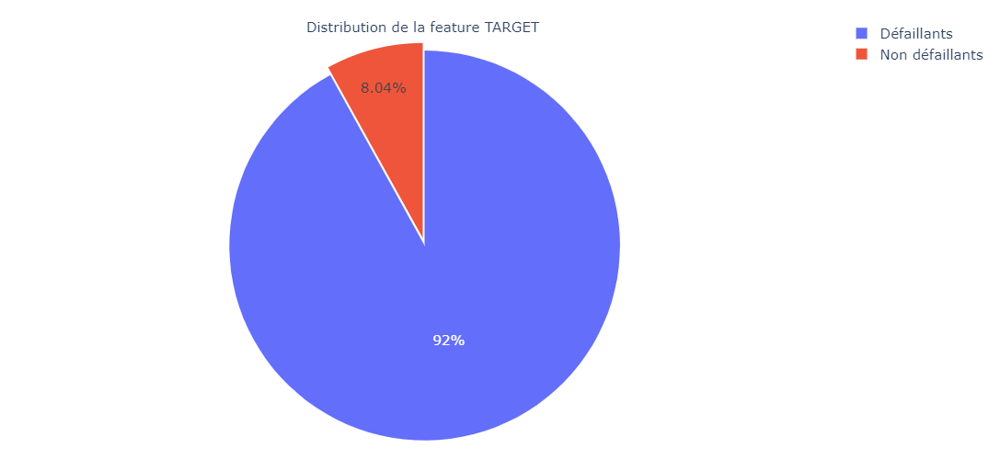

In [6]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_std.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

## [3. Initialisation de la modélisation avec la librairie Pycaret avec l'ensemble des features](#plan)<a class="anchor" id="3"></a>

In [7]:
%time model_setup  =  setup ( data = train_sample_std ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.80, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 1243)"
5,Missing Values,False
6,Numeric Features,1208
7,Categorical Features,33
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 2min 37s


In [8]:
metriques = get_metrics()
metriques

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x00000261D6A9B160>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x00000261D6A88DC0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x00000261D6A9B...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x00000261D6A9B...,make_scorer(matthews_corrcoef),pred,{},True,True,False


In [9]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x00000261D6AA0430>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [10]:
metriques = get_metrics()
metriques

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x00000261D6A9B160>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x00000261D6A88DC0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x00000261D6A9B...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x00000261D6A9B...,make_scorer(matthews_corrcoef),pred,{},True,True,False
logloss,Log Loss,Log Loss,<function log_loss at 0x00000261D6AA0430>,"make_scorer(log_loss, greater_is_better=False)",pred,{},False,True,True


In [11]:
%time best_model  =  compare_models (sort = 'AUC', exclude = ['catboost', 'xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9176,0.7686,0.0514,0.4234,0.0910,0.0753,0.1242,2.8466,15.7570
gbc,Gradient Boosting Classifier,0.9170,0.7501,0.0416,0.3843,0.0747,0.0602,0.1041,2.8667,169.0260
rf,Random Forest Classifier,0.9185,0.7382,0.0118,0.4052,0.0229,0.0187,0.0579,2.8135,15.8650
et,Extra Trees Classifier,0.9183,0.7374,0.0129,0.3851,0.0248,0.0198,0.0568,2.8207,12.1650
lda,Linear Discriminant Analysis,0.7437,0.7286,0.5757,0.1739,0.2671,0.1628,0.2059,8.8536,19.7380
lr,Logistic Regression,0.7484,0.7261,0.5629,0.1744,0.2662,0.1625,0.2035,8.6910,32.9120
ada,Ada Boost Classifier,0.8967,0.7219,0.1310,0.2444,0.1697,0.1202,0.1272,3.5690,37.1870
knn,K Neighbors Classifier,0.3910,0.6088,0.7904,0.0977,0.1739,0.0345,0.0841,21.0360,86.4060
dt,Decision Tree Classifier,0.8353,0.5501,0.2096,0.1445,0.1709,0.0829,0.0848,5.6875,12.6000
nb,Naive Bayes,0.3037,0.5281,0.7873,0.0860,0.1550,0.0103,0.0302,24.0496,2.1200


Wall time: 1h 11min 37s


## [4. Sélection des 50 principales features](#plan)<a class="anchor" id="4"></a>

In [13]:
n=50 
X_train=get_config('X_train') 
feature_names = pd.DataFrame(X_train.columns) 
feature_names['var'] = feature_names 
feature_imp = pd.DataFrame(best_model.feature_importances_) 
feature_imp['imp'] = feature_imp 
var_imp = pd .concat([feature_names,feature_imp],axis=1) 
var_imp = var_imp[['var', 'imp']] 
var_imp = var_imp.sort_values(['imp'],ascending=False) 
var_imp_fin=var_imp['var' ].head(n).values.tolist() 
print(var_imp_fin)

['TARGET_NEIGHBORS_500_MEAN', 'WEEKDAY_APPR_PROCESS_START_1', 'REGIONS_RATING_INCOME_MUL_1', 'EMERGENCYSTATE_MODE_0', 'CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE', 'REGION_RATING_CLIENT_0', 'FLAG_WORK_PHONE_-0.498996764421463', 'CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED', 'FLAG_REGIONS', 'FLAG_DOCUMENT_3_0.6390508413314819', 'CREDIT_EXT_RATIO', 'OBS_60_CREDIT_RATIO', 'FLAG_CONTACTS_SUM', 'WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2', 'SK_DPD_DEF_MAX_YEAR_REST_MEAN', 'AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'WEEKDAY_APPR_PROCESS_START_MAX_ALL', 'AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE', 'DAYS_ID_PUBLISH', 'FLAG_PHONE_-0.625244677066803', 'DAYS_BIRTH', 'EXT_SOURCE_MIN', 'AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR', 'WEIGHTED_EXT_SOURCE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL', 'INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO', 'NAME_EDUCATION_TYPE_1', 'CREDIT_GOODS_DIFF', 'AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL'

In [ ]:
features_50 =  pd.DataFrame(var_imp_fin)
features_50.to_csv('data_pycaret/features_50.csv')

In [4]:
for index, elem in enumerate(var_imp_fin):
    if elem == 'FLAG_WORK_PHONE_-0.498996764421463':
        var_imp_fin[index] = 'FLAG_WORK_PHONE'
    if elem == 'FLAG_DOCUMENT_3_0.6390508413314819':
        var_imp_fin[index] = 'FLAG_DOCUMENT_3'
    if elem == 'FLAG_PHONE_-0.625244677066803':
        var_imp_fin[index] = 'FLAG_PHONE'  
    if elem == 'LIVE_CITY_NOT_WORK_CITY_2.1375839710235596':
        var_imp_fin[index] = 'LIVE_CITY_NOT_WORK_CITY'    

In [14]:
features_50.columns = ['Features importance']
features_50

,Features importance
0,TARGET_NEIGHBORS_500_MEAN
1,WEEKDAY_APPR_PROCESS_START_1
2,REGIONS_RATING_INCOME_MUL_1
3,EMERGENCYSTATE_MODE_0
4,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE...
5,REGION_RATING_CLIENT_0
6,FLAG_WORK_PHONE
7,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE...
8,FLAG_REGIONS
9,FLAG_DOCUMENT_3


In [15]:
features_50 =  pd.DataFrame(var_imp_fin)
features_50.to_csv('data_pycaret/features_50.csv')

In [30]:
train_df_std_50 = train_df_std[['SK_ID_CURR'] + var_imp_fin + ['TARGET']]
train_df_std_50.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,TARGET
0,100002,3.190860,0.449980,0.384462,0.963572,-0.020491,0.113357,-0.498997,-0.023502,-0.548348,...,-1.316671,-0.210551,-0.166152,0.011009,-0.667682,-0.211209,0.25381,-0.467818,-1.044230,1
1,100003,-0.567492,-1.632332,-0.025011,0.963572,-0.020491,2.030894,-0.498997,-0.023502,-0.548348,...,0.563863,-0.210551,0.592657,0.011009,-0.085927,-0.304546,0.25381,-0.467818,1.259898,0


In [32]:
# Echantillon pour entraînement pycaret
%time train_sample_std_50 = train_df_std_50.sample(n=30000, random_state=0)

Wall time: 53 ms


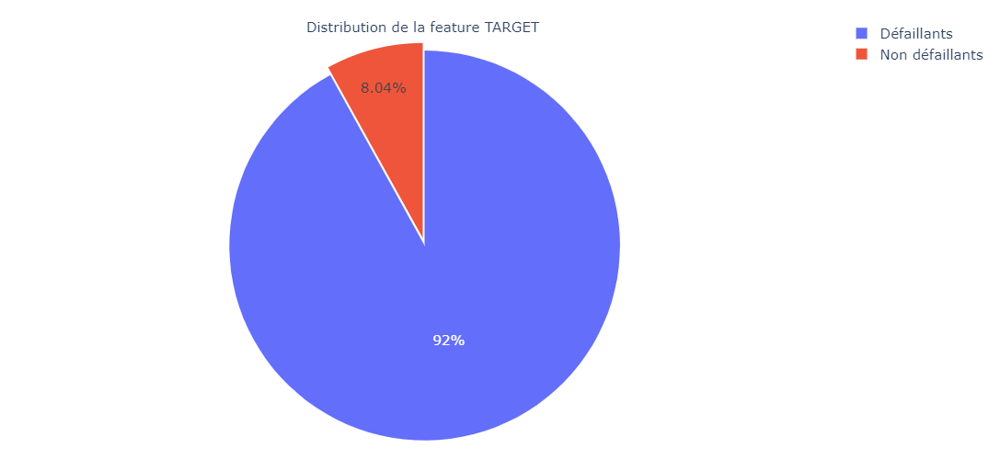

In [33]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_std_50.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

## [5. Réexécuter l'initialisation de la modélisation avec les 50 principales features](#plan)<a class="anchor" id="5"></a>

### Sur un échantillon normalisé de 30 000 individus

In [34]:
%time model_setup_50  =  setup ( data = train_sample_std_50 ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.80, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 52)"
5,Missing Values,False
6,Numeric Features,46
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 3.2 s


In [36]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x00000261D6AA0430>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [37]:
%time best_model_50  =  compare_models (sort = 'AUC', exclude = ['catboost', 'xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9157,0.7676,0.0616,0.3710,0.1049,0.0844,0.1235,2.9128,0.7430
lr,Logistic Regression,0.7316,0.7626,0.6610,0.1823,0.2857,0.1816,0.2391,9.2695,0.2860
lda,Linear Discriminant Analysis,0.7361,0.7603,0.6507,0.1833,0.2860,0.1825,0.2379,9.1141,0.3220
et,Extra Trees Classifier,0.9172,0.7513,0.0472,0.4175,0.0846,0.0691,0.1178,2.8595,1.6430
gbc,Gradient Boosting Classifier,0.9152,0.7508,0.0565,0.3500,0.0969,0.0767,0.1134,2.9272,8.1980
rf,Random Forest Classifier,0.9158,0.7428,0.0277,0.2950,0.0505,0.0372,0.0682,2.9099,2.1950
ada,Ada Boost Classifier,0.8877,0.7185,0.1659,0.2329,0.1931,0.1348,0.1373,3.8785,1.6230
nb,Naive Bayes,0.2628,0.6855,0.8927,0.0906,0.1644,0.0201,0.0674,25.4614,0.1000
knn,K Neighbors Classifier,0.6585,0.6578,0.5722,0.1315,0.2138,0.0943,0.1362,11.7938,6.9840
qda,Quadratic Discriminant Analysis,0.2415,0.6229,0.8747,0.0867,0.1577,0.0118,0.0422,26.1983,0.2070


Wall time: 3min 53s


### Sur le jeu complet normalisé

In [40]:
# Jeu complet
display(train_df_std_50.head(2))
print('Shape : ', train_df_std_50.shape)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,TARGET
0,100002,3.190860,0.449980,0.384462,0.963572,-0.020491,0.113357,-0.498997,-0.023502,-0.548348,...,-1.316671,-0.210551,-0.166152,0.011009,-0.667682,-0.211209,0.25381,-0.467818,-1.044230,1
1,100003,-0.567492,-1.632332,-0.025011,0.963572,-0.020491,2.030894,-0.498997,-0.023502,-0.548348,...,0.563863,-0.210551,0.592657,0.011009,-0.085927,-0.304546,0.25381,-0.467818,1.259898,0


Shape :  (307507, 52)


In [41]:
%time model_setup_50  =  setup ( data = train_df_std_50 ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.80, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(307507, 52)"
5,Missing Values,False
6,Numeric Features,46
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 15.5 s


In [42]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x00000261D6AA0430>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [ ]:
%time best_model_50_all  =  compare_models (sort = 'AUC', exclude = ['catboost', 'xgboost'])

IntProgress(value=0, description='Processing: ', max=69)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,01:33:57
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,K Neighbors Classifier


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lr,Logistic Regression,0.7339,0.7675,0.6553,0.1823,0.2853,0.1815,0.2379,9.1897,14.1380


Le fait d'entraîner le jeu entier (307507 raws) est trop consommateur de ressources machines et prend un temps anormalement long sans apporter de performances supérieures par rapport à un jeu de données réduit (30000 raws).

### Sur un jeu réduit non normalisé à 40 000 individus

In [2]:
train_df_50 = pd.read_csv('data_pycaret/train_df_50.csv').drop("Unnamed: 0",axis=1)

In [3]:
# Echantillon pour entraînement pycaret
%time train_sample_50 = train_df_50.sample(n=40000, random_state=0)
train_sample_50.head(2)

Wall time: 48.3 ms


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,TARGET
289122,434945,0.056,0.0835,0.08014,0.930,0.412705,0.921,1,0.0,0,1,115731.23,1.687496e+04,4,5.0,0.0,26100.0,6.0,0.0,-3209,0,30.66,0.5830,0.014565,5.875,4.0,0.412705,0.810473,0.08484,0.00001,0.0,0.0,7020.585,0.0,0.937,0.0,0.0704,0.000,1.25,1.0,8712000.0,0.0,0.7820,0.0,5773.5,0.1671,0.008140,2540369.20,0.0,0,0.187,0
188488,318528,0.072,0.0776,0.08010,0.907,0.568536,0.921,1,0.0,0,0,392881.00,2.250000e+10,5,7.0,6.0,26100.0,7.0,0.0,-1069,1,48.06,0.5083,0.091060,5.130,0.0,0.355335,0.681727,0.08940,0.00001,0.0,0.0,12394.440,0.0,0.937,0.0,0.0704,9794.756,0.00,1.0,1876050.0,0.0,0.5083,0.0,16434.0,0.0000,0.003714,133763.06,3.0,0,0.187,0


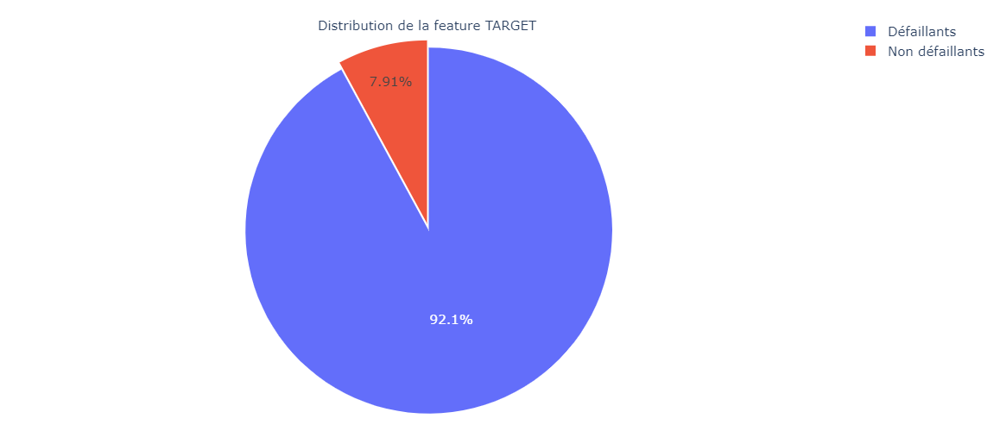

In [4]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_50.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

In [5]:
%time model_setup_50  =  setup ( data = train_sample_50 ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.80, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(40000, 52)"
5,Missing Values,False
6,Numeric Features,44
7,Categorical Features,6
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 4.2 s


In [6]:
%time best_model_50_sample  =  compare_models (sort = 'AUC', exclude = ['catboost', 'xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9201,0.7712,0.0395,0.4456,0.0724,0.0603,0.1135,0.7990
lda,Linear Discriminant Analysis,0.7424,0.7679,0.6526,0.1833,0.2862,0.1856,0.2417,0.4600
gbc,Gradient Boosting Classifier,0.9199,0.7520,0.0304,0.4082,0.0564,0.0460,0.0931,12.1050
et,Extra Trees Classifier,0.9201,0.7447,0.0166,0.3832,0.0317,0.0252,0.0653,1.9680
rf,Random Forest Classifier,0.9201,0.7439,0.0174,0.4127,0.0333,0.0266,0.0700,2.8570
ada,Ada Boost Classifier,0.9049,0.7239,0.0901,0.2387,0.1299,0.0904,0.1029,2.5990
qda,Quadratic Discriminant Analysis,0.1339,0.6210,0.9522,0.0803,0.1481,0.0027,0.0181,0.3240
knn,K Neighbors Classifier,0.7115,0.5608,0.3372,0.1015,0.1560,0.0392,0.0496,1.0350
dt,Decision Tree Classifier,0.8466,0.5545,0.2075,0.1531,0.1762,0.0937,0.0951,0.4830
lr,Logistic Regression,0.6118,0.5301,0.3692,0.0715,0.1105,-0.0001,-0.0007,0.5830


Wall time: 4min 8s


## [6. Entraînement du modèle Lightgbm sur un jeu normalisé avec les 50 features principales](#plan)<a class="anchor" id="6"></a>

**Raisons du choix :** Pour l'Accuracy, l'AUC et le Log Loss

### **Setup**

In [4]:
train_df_std_50 = pd.read_csv('data_pycaret/train_df_std_50.csv').drop("Unnamed: 0",axis=1)
train_df_std_50.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,TARGET
0,100002,3.190860,0.449980,0.384462,0.963572,-0.020491,0.113357,-0.498997,-0.023502,-0.548348,0.639051,-0.022454,-0.763747,0.745254,-0.591277,0.000000,1.205935,-2.064538,0.070652,0.579152,1.599374,-1.506938,-1.743351,0.472301,-2.764640,0.240654,-0.011837,-0.003199,0.552909,-0.075504,-0.043237,-0.184087,-0.326111,-0.016613,-1.156419,0.0,0.622380,-0.293172,-0.910223,-0.400330,-0.350491,-0.041434,-1.316671,-0.210551,-0.166152,0.011009,-0.667682,-0.211209,0.25381,-0.467818,-1.044230,1
1,100003,-0.567492,-1.632332,-0.025011,0.963572,-0.020491,2.030894,-0.498997,-0.023502,-0.548348,0.639051,-0.027544,-0.763721,0.745254,-0.591277,-0.041812,-1.221578,-1.480501,8.636938,1.790850,1.599374,0.167526,-0.393577,0.000000,-0.152643,-0.175852,-0.011837,-0.003199,-1.732925,1.462351,0.000000,-0.186100,0.000000,-0.016613,0.807244,0.0,-1.095564,-0.293172,-0.910223,-1.308896,-0.211852,-0.041434,0.563863,-0.210551,0.592657,0.011009,-0.085927,-0.304546,0.25381,-0.467818,1.259898,0


In [5]:
# Echantillon pour entraînement pycaret
%time train_sample_50_lgb = train_df_std_50.sample(n=40000, random_state=0)

Wall time: 28 ms


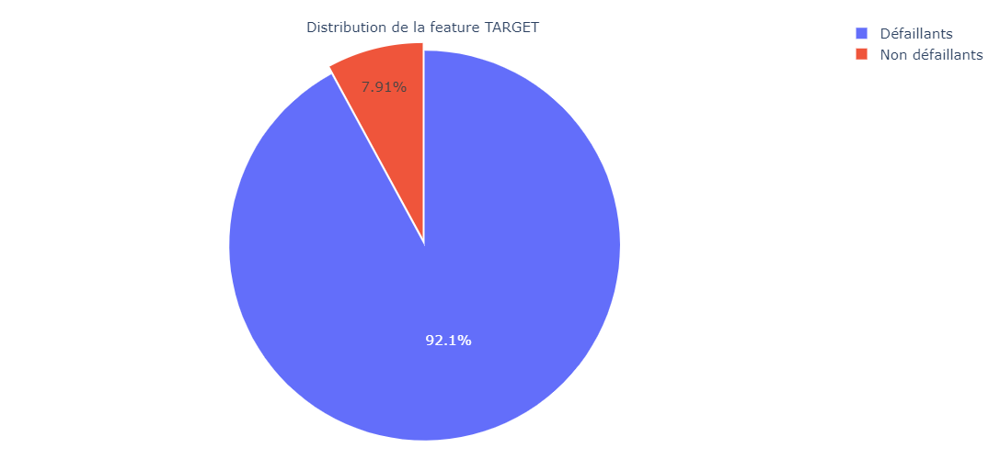

In [6]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_50_lgb.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

In [7]:
%time model_setup_50  =  setup ( data = train_sample_50_lgb ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.80, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(40000, 52)"
5,Missing Values,False
6,Numeric Features,46
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 4.32 s


In [13]:
results_setup_lgb = pull()
results_setup_lgb

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(40000, 52)"
5,Missing Values,False
6,Numeric Features,46
7,Categorical Features,4
8,Ordinal Features,False
9,High Cardinality Features,False


### **Comparaison des modeles**

In [8]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x000001C9B683B5E0>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [15]:
%time best_model_50_sample_lgb  =  compare_models (sort = 'AUC', exclude = ['catboost', 'xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9186,0.7684,0.0652,0.4111,0.1122,0.0926,0.1381,2.8106,1.2180
lr,Logistic Regression,0.7342,0.7626,0.6636,0.1801,0.2832,0.1814,0.2399,9.1789,0.7390
lda,Linear Discriminant Analysis,0.7386,0.7615,0.6502,0.1804,0.2824,0.1810,0.2370,9.0288,0.5020
gbc,Gradient Boosting Classifier,0.9166,0.7529,0.0581,0.3422,0.0991,0.0778,0.1133,2.8808,14.1390
et,Extra Trees Classifier,0.9178,0.7515,0.0364,0.3239,0.0652,0.0501,0.0855,2.8397,2.4430
rf,Random Forest Classifier,0.9177,0.7377,0.0340,0.3139,0.0612,0.0464,0.0805,2.8441,3.1520
ada,Ada Boost Classifier,0.8906,0.7211,0.1561,0.2246,0.1836,0.1272,0.1298,3.7777,2.3870
nb,Naive Bayes,0.2511,0.6760,0.8814,0.0862,0.1570,0.0151,0.0537,25.8669,0.1630
knn,K Neighbors Classifier,0.6601,0.6471,0.5538,0.1257,0.2049,0.0873,0.1263,11.7391,13.4250
qda,Quadratic Discriminant Analysis,0.2394,0.6223,0.8609,0.0833,0.1518,0.0089,0.0328,26.2695,0.3220


Wall time: 6min 39s


In [20]:
results_best_model_50_sample_lgb = pull()
results_best_model_50_sample_lgb

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9186,0.7684,0.0652,0.4111,0.1122,0.0926,0.1381,2.8106,1.218
lr,Logistic Regression,0.7342,0.7626,0.6636,0.1801,0.2832,0.1814,0.2399,9.1789,0.739
lda,Linear Discriminant Analysis,0.7386,0.7615,0.6502,0.1804,0.2824,0.1810,0.2370,9.0288,0.502
gbc,Gradient Boosting Classifier,0.9166,0.7529,0.0581,0.3422,0.0991,0.0778,0.1133,2.8808,14.139
et,Extra Trees Classifier,0.9178,0.7515,0.0364,0.3239,0.0652,0.0501,0.0855,2.8397,2.443
rf,Random Forest Classifier,0.9177,0.7377,0.0340,0.3139,0.0612,0.0464,0.0805,2.8441,3.152
ada,Ada Boost Classifier,0.8906,0.7211,0.1561,0.2246,0.1836,0.1272,0.1298,3.7777,2.387
nb,Naive Bayes,0.2511,0.6760,0.8814,0.0862,0.1570,0.0151,0.0537,25.8669,0.163
knn,K Neighbors Classifier,0.6601,0.6471,0.5538,0.1257,0.2049,0.0873,0.1263,11.7391,13.425
qda,Quadratic Discriminant Analysis,0.2394,0.6223,0.8609,0.0833,0.1518,0.0089,0.0328,26.2695,0.322


In [40]:
# Sauveagrde
results_best_model_50_sample_lgb.to_csv('results_model_lighgbm/results_best_model_50_sample_lgb.csv')

### **Création du modele lightgbm**

In [9]:
lgb = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9194,0.7656,0.0593,0.4286,0.1042,0.0866,0.1362,2.7847
1,0.9200,0.7387,0.0474,0.4444,0.0857,0.0716,0.1249,2.7631
2,0.9209,0.7644,0.0909,0.5000,0.1538,0.1327,0.1884,2.7307
3,0.9169,0.7505,0.0632,0.3556,0.1074,0.0855,0.1224,2.8710
4,0.9162,0.7730,0.0593,0.3333,0.1007,0.0787,0.1125,2.8926
5,0.9200,0.7894,0.0672,0.4595,0.1172,0.0991,0.1525,2.7631
6,0.9166,0.7769,0.0514,0.3250,0.0887,0.0686,0.1025,2.8818
7,0.9194,0.7673,0.0632,0.4324,0.1103,0.0920,0.1416,2.7847
8,0.9200,0.7763,0.0791,0.4651,0.1351,0.1148,0.1670,2.7631
9,0.9169,0.7817,0.0711,0.3673,0.1192,0.0960,0.1332,2.8710


In [22]:
results_create_lgb = pull()
results_create_lgb

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9194,0.7656,0.0593,0.4286,0.1042,0.0866,0.1362,2.7847
1,0.9200,0.7387,0.0474,0.4444,0.0857,0.0716,0.1249,2.7631
2,0.9209,0.7644,0.0909,0.5000,0.1538,0.1327,0.1884,2.7307
3,0.9169,0.7505,0.0632,0.3556,0.1074,0.0855,0.1224,2.8710
4,0.9162,0.7730,0.0593,0.3333,0.1007,0.0787,0.1125,2.8926
5,0.9200,0.7894,0.0672,0.4595,0.1172,0.0991,0.1525,2.7631
6,0.9166,0.7769,0.0514,0.3250,0.0887,0.0686,0.1025,2.8818
7,0.9194,0.7673,0.0632,0.4324,0.1103,0.0920,0.1416,2.7847
8,0.9200,0.7763,0.0791,0.4651,0.1351,0.1148,0.1670,2.7631
9,0.9169,0.7817,0.0711,0.3673,0.1192,0.0960,0.1332,2.8710


In [41]:
# Sauveagrde
results_create_lgb.to_csv('results_model_lighgbm/results_create_lgb.csv')

### **Optimisation du seuil de classification => paramètre de predict_model**

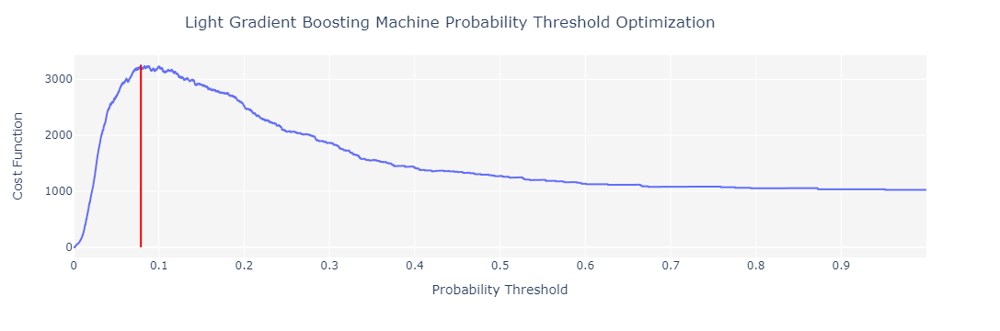

Optimized Probability Threshold: 0.0789 | Optimized Cost Function: 3251


0.0789

In [25]:
optimize_threshold(lgb, true_negative = 1, false_negative = -10)

### **Réglage des hyperparamètres du modele lightgbm**

In [31]:
tuned_lgbm  =  tune_model (lgb,  search_library = 'tune-sklearn',search_algorithm = 'hyperopt', n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9191,0.7532,0.0593,0.4167,0.1038,0.0858,0.1335,2.7955
1,0.9175,0.7293,0.0316,0.2963,0.0571,0.0425,0.0743,2.8495
2,0.9209,0.7530,0.0632,0.5000,0.1123,0.0962,0.1568,2.7307
3,0.9141,0.7389,0.0316,0.2105,0.0550,0.0351,0.0534,2.9682
4,0.9175,0.7646,0.0435,0.3333,0.0769,0.0598,0.0962,2.8495
5,0.9197,0.7890,0.0672,0.4474,0.1168,0.0982,0.1496,2.7739
6,0.9156,0.7683,0.0435,0.2821,0.0753,0.0554,0.0836,2.9142
7,0.9175,0.7525,0.0514,0.3514,0.0897,0.0709,0.1091,2.8495
8,0.9172,0.7603,0.0514,0.3421,0.0893,0.0701,0.1069,2.8602
9,0.9144,0.7677,0.0553,0.2857,0.0927,0.0688,0.0955,2.9574


In [32]:
results_tuned_lgb_hyperopt = pull()
results_tuned_lgb_hyperopt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9191,0.7532,0.0593,0.4167,0.1038,0.0858,0.1335,2.7955
1,0.9175,0.7293,0.0316,0.2963,0.0571,0.0425,0.0743,2.8495
2,0.9209,0.7530,0.0632,0.5000,0.1123,0.0962,0.1568,2.7307
3,0.9141,0.7389,0.0316,0.2105,0.0550,0.0351,0.0534,2.9682
4,0.9175,0.7646,0.0435,0.3333,0.0769,0.0598,0.0962,2.8495
5,0.9197,0.7890,0.0672,0.4474,0.1168,0.0982,0.1496,2.7739
6,0.9156,0.7683,0.0435,0.2821,0.0753,0.0554,0.0836,2.9142
7,0.9175,0.7525,0.0514,0.3514,0.0897,0.0709,0.1091,2.8495
8,0.9172,0.7603,0.0514,0.3421,0.0893,0.0701,0.1069,2.8602
9,0.9144,0.7677,0.0553,0.2857,0.0927,0.0688,0.0955,2.9574


In [33]:
tuned_lgbm  =  tune_model (lgb)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9194,0.7568,0.0791,0.4444,0.1342,0.1130,0.1617,2.7847
1,0.9206,0.7330,0.0711,0.4865,0.1241,0.1061,0.1633,2.7415
2,0.9225,0.7460,0.0830,0.5676,0.1448,0.1272,0.1958,2.6768
3,0.9150,0.7376,0.0553,0.2979,0.0933,0.0703,0.0990,2.9358
4,0.9172,0.7609,0.0791,0.3846,0.1311,0.1071,0.1455,2.8603
5,0.9219,0.7779,0.0791,0.5405,0.1379,0.1202,0.1850,2.6983
6,0.9172,0.7655,0.0672,0.3696,0.1137,0.0916,0.1300,2.8602
7,0.9162,0.7566,0.0593,0.3333,0.1007,0.0787,0.1125,2.8926
8,0.9216,0.7691,0.0791,0.5263,0.1375,0.1193,0.1817,2.7091
9,0.9144,0.7854,0.0672,0.3091,0.1104,0.0845,0.1127,2.9574


In [34]:
results_tuned_lgb_base = pull()
results_tuned_lgb_base

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9194,0.7568,0.0791,0.4444,0.1342,0.1130,0.1617,2.7847
1,0.9206,0.7330,0.0711,0.4865,0.1241,0.1061,0.1633,2.7415
2,0.9225,0.7460,0.0830,0.5676,0.1448,0.1272,0.1958,2.6768
3,0.9150,0.7376,0.0553,0.2979,0.0933,0.0703,0.0990,2.9358
4,0.9172,0.7609,0.0791,0.3846,0.1311,0.1071,0.1455,2.8603
5,0.9219,0.7779,0.0791,0.5405,0.1379,0.1202,0.1850,2.6983
6,0.9172,0.7655,0.0672,0.3696,0.1137,0.0916,0.1300,2.8602
7,0.9162,0.7566,0.0593,0.3333,0.1007,0.0787,0.1125,2.8926
8,0.9216,0.7691,0.0791,0.5263,0.1375,0.1193,0.1817,2.7091
9,0.9144,0.7854,0.0672,0.3091,0.1104,0.0845,0.1127,2.9574


In [10]:
tuned_lgbm  =  tune_model (lgb,  search_library = 'tune-sklearn',search_algorithm = 'optuna', n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9197,0.7458,0.1146,0.4677,0.1841,0.1579,0.2025,2.7739
1,0.9166,0.7246,0.0711,0.3600,0.1188,0.0952,0.1312,2.8818
2,0.9191,0.7407,0.1146,0.4531,0.1830,0.1560,0.1980,2.7955
3,0.9125,0.7200,0.0711,0.2857,0.1139,0.0851,0.1085,3.0222
4,0.9128,0.7448,0.0751,0.2969,0.1199,0.0908,0.1153,3.0114
5,0.9131,0.7654,0.0791,0.3077,0.1258,0.0966,0.1220,3.0006
6,0.9169,0.7469,0.0870,0.3860,0.1419,0.1162,0.1532,2.8710
7,0.9166,0.7380,0.0791,0.3704,0.1303,0.1054,0.1414,2.8818
8,0.9156,0.7558,0.1028,0.3768,0.1615,0.1321,0.1638,2.9142
9,0.9175,0.7661,0.1186,0.4225,0.1852,0.1559,0.1917,2.8495


In [45]:
print(tuned_lgbm)

LGBMClassifier(bagging_fraction=0.7442076920033716, bagging_freq=0,
               boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               feature_fraction=0.9420277123373523, importance_type='split',
               learning_rate=0.2576978557016524, max_depth=-1,
               min_child_samples=62, min_child_weight=0.001,
               min_split_gain=0.5783896143871318, n_estimators=140, n_jobs=-1,
               num_leaves=31, objective=None, random_state=1,
               reg_alpha=3.086773977665396e-06, reg_lambda=4.04852460144394e-08,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)


In [44]:
results_tuned_lgb_optuma = pull()
results_tuned_lgb_optuma

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9197,0.7458,0.1146,0.4677,0.1841,0.1579,0.2025,2.7739
1,0.9166,0.7246,0.0711,0.3600,0.1188,0.0952,0.1312,2.8818
2,0.9191,0.7407,0.1146,0.4531,0.1830,0.1560,0.1980,2.7955
3,0.9125,0.7200,0.0711,0.2857,0.1139,0.0851,0.1085,3.0222
4,0.9128,0.7448,0.0751,0.2969,0.1199,0.0908,0.1153,3.0114
5,0.9131,0.7654,0.0791,0.3077,0.1258,0.0966,0.1220,3.0006
6,0.9169,0.7469,0.0870,0.3860,0.1419,0.1162,0.1532,2.8710
7,0.9166,0.7380,0.0791,0.3704,0.1303,0.1054,0.1414,2.8818
8,0.9156,0.7558,0.1028,0.3768,0.1615,0.1321,0.1638,2.9142
9,0.9175,0.7661,0.1186,0.4225,0.1852,0.1559,0.1917,2.8495


In [43]:
# Sauveagrdes
results_tuned_lgb_hyperopt.to_csv('results_model_lighgbm/results_tuned_lgb_hyperopt.csv')
results_tuned_lgb_optuma.to_csv('results_model_lighgbm/results_tuned_lgb_optuma.csv')
results_tuned_lgb_base.to_csv('results_model_lighgbm/results_tuned_lgb_base.csv')

### **Tracés du modèle lightgbm**

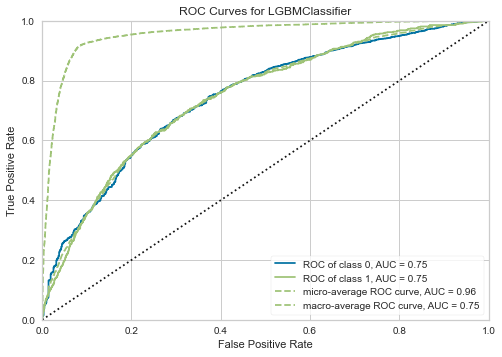

In [46]:
plot_model ( tuned_lgbm ,  plot  =  'auc' )

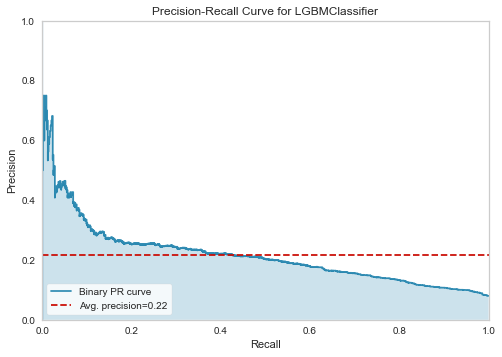

In [47]:
plot_model ( tuned_lgbm ,  plot  =  'pr' )

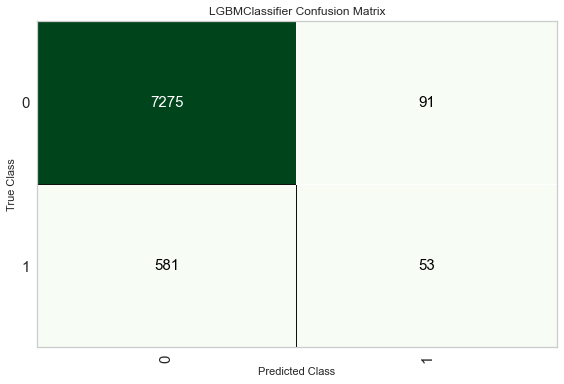

In [48]:
plot_model ( tuned_lgbm ,  plot  =  'confusion_matrix' )

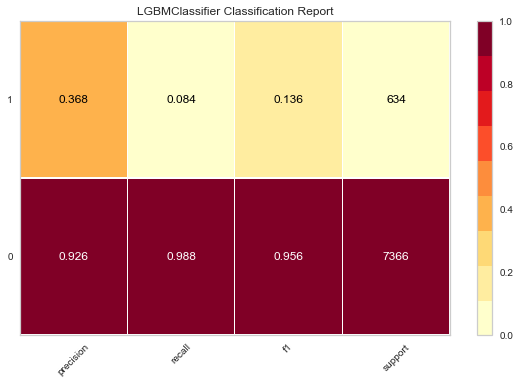

In [49]:
plot_model ( tuned_lgbm ,  plot  =  'class_report' )

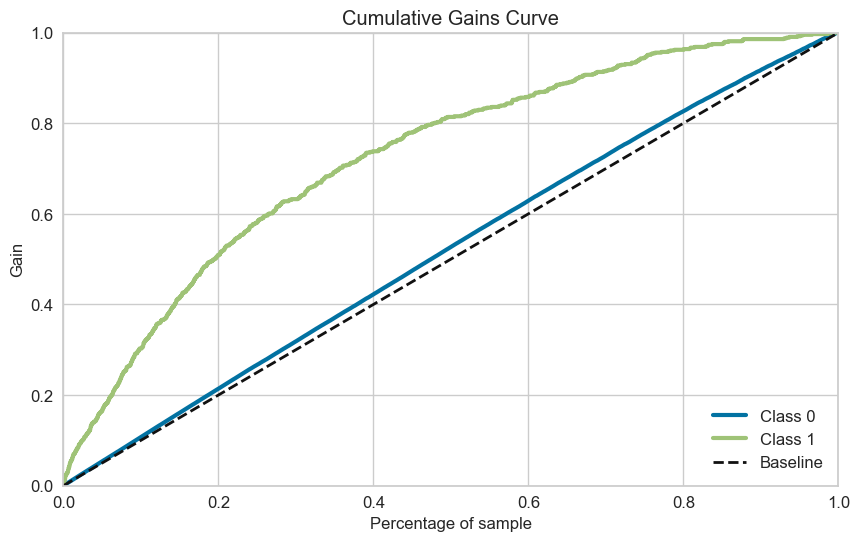

In [50]:
plot_model ( tuned_lgbm ,  plot  =  'gain' )

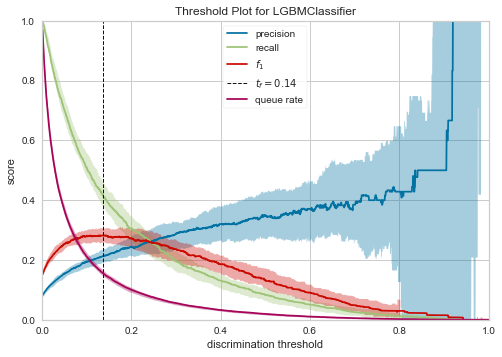

In [51]:
plot_model ( tuned_lgbm ,  plot  =  'threshold' )

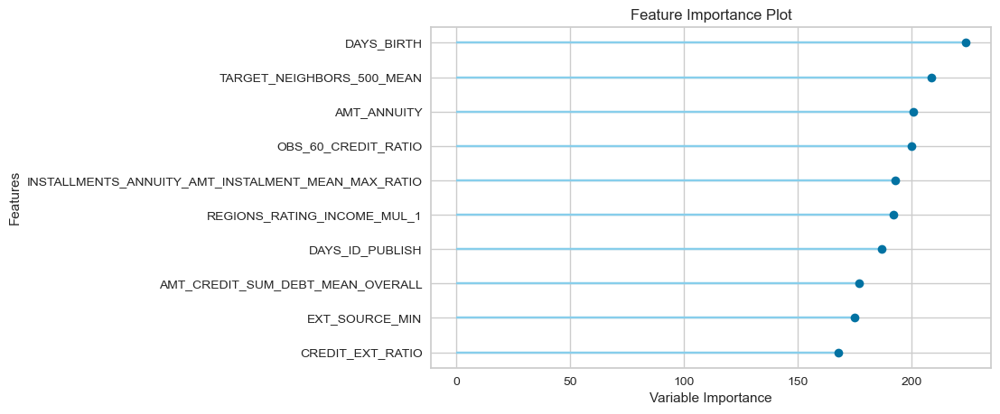

In [53]:
plot_model ( tuned_lgbm ,  plot  =  'feature' )

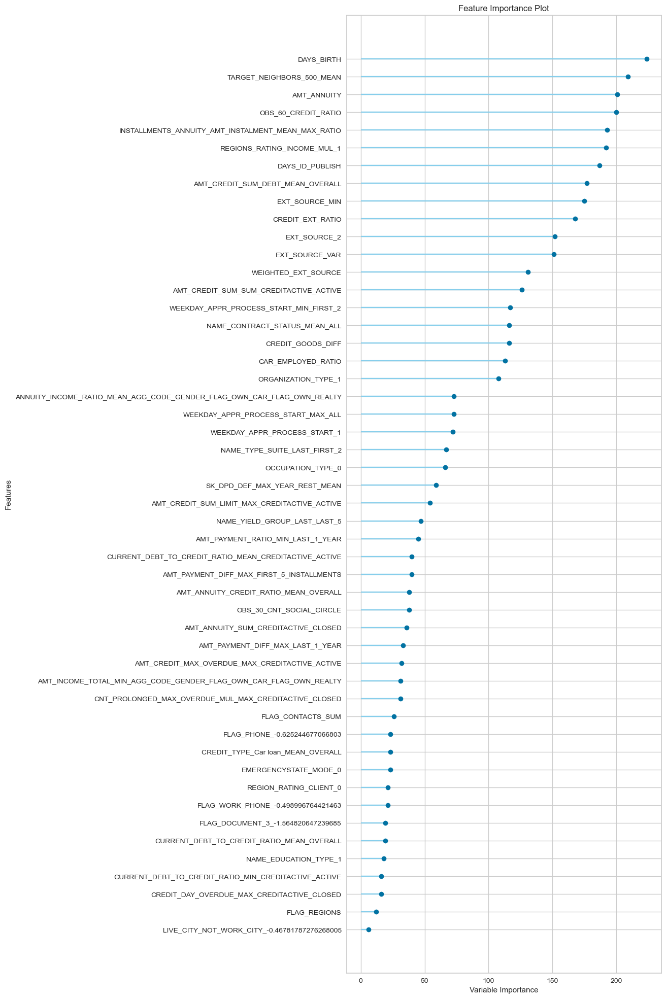

In [54]:
plot_model ( tuned_lgbm ,  plot  =  'feature_all' )

In [55]:
plot_model ( tuned_lgbm ,  plot  =  'parameter' )

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1.0
importance_type,split
learning_rate,0.2576978557016524
max_depth,-1
min_child_samples,62
min_child_weight,0.001
min_split_gain,0.5783896143871318
n_estimators,140


### **Interprétation du modèle lightgbm**

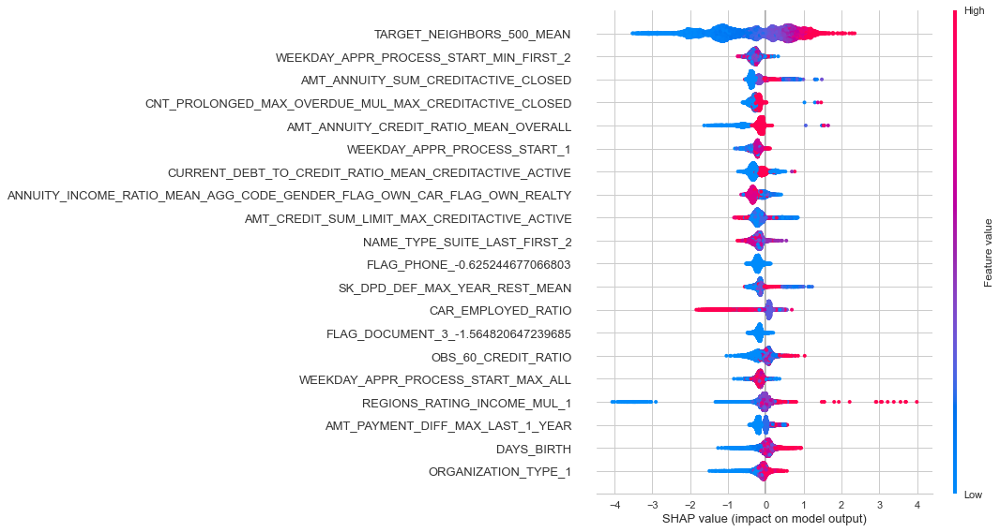

In [56]:
interpret_model(tuned_lgbm)

In [13]:
shap.initjs()
interpret_model(tuned_lgbm, plot = 'reason', observation = 10)

In [ ]:
# interpret_model(tuned_lgbm, plot = 'pfi')

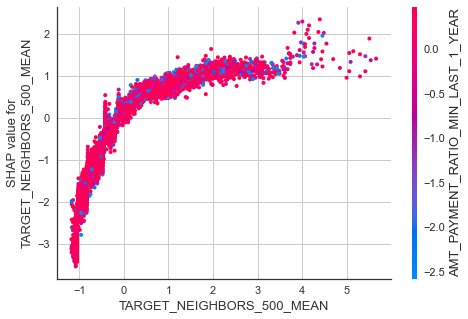

In [61]:
interpret_model(tuned_lgbm, plot = 'correlation')

### **Finalisation du modèle lightgbm**

In [62]:
final_lghtgbm  =  finalize_model ( tuned_lgbm )

In [63]:
results_final_lightgbm = pull()
results_final_lightgbm

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9197,0.7458,0.1146,0.4677,0.1841,0.1579,0.2025,2.7739
1,0.9166,0.7246,0.0711,0.3600,0.1188,0.0952,0.1312,2.8818
2,0.9191,0.7407,0.1146,0.4531,0.1830,0.1560,0.1980,2.7955
3,0.9125,0.7200,0.0711,0.2857,0.1139,0.0851,0.1085,3.0222
4,0.9128,0.7448,0.0751,0.2969,0.1199,0.0908,0.1153,3.0114
5,0.9131,0.7654,0.0791,0.3077,0.1258,0.0966,0.1220,3.0006
6,0.9169,0.7469,0.0870,0.3860,0.1419,0.1162,0.1532,2.8710
7,0.9166,0.7380,0.0791,0.3704,0.1303,0.1054,0.1414,2.8818
8,0.9156,0.7558,0.1028,0.3768,0.1615,0.1321,0.1638,2.9142
9,0.9175,0.7661,0.1186,0.4225,0.1852,0.1559,0.1917,2.8495


In [64]:
results_final_lightgbm.to_csv('results_model_lighgbm/results_final_lightgbm.csv')

In [65]:
print(final_lghtgbm)

LGBMClassifier(bagging_fraction=0.7442076920033716, bagging_freq=0,
               boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               feature_fraction=0.9420277123373523, importance_type='split',
               learning_rate=0.2576978557016524, max_depth=-1,
               min_child_samples=62, min_child_weight=0.001,
               min_split_gain=0.5783896143871318, n_estimators=140, n_jobs=-1,
               num_leaves=31, objective=None, random_state=1,
               reg_alpha=3.086773977665396e-06, reg_lambda=4.04852460144394e-08,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)


### **Prédire avec le modèle lightgbm sur le holdout du jeu d'entraînement**

In [66]:
pred_lightgbm_holdout = predict_model ( final_lghtgbm )
pred_lightgbm_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Light Gradient Boosting Machine,0.9531,0.9806,0.4274,0.9576,0.5911,0.5700,0.6227,1.6190


,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,...,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,FLAG_WORK_PHONE_-0.498996764421463,FLAG_DOCUMENT_3_-1.564820647239685,FLAG_PHONE_-0.625244677066803,LIVE_CITY_NOT_WORK_CITY_-0.46781787276268005,TARGET,Label,Score
0,-0.717826,1.439078,-0.159524,0.963572,0.000000,0.113357,-0.023502,-0.548348,-0.063279,-0.763748,...,-0.304546,-0.391520,-1.044230,0.0,1.0,0.0,0.0,0,0,0.9955
1,1.116249,1.439078,1.371548,0.963572,-0.020491,-1.885379,-0.023502,-0.548348,-0.044547,-0.763741,...,-0.301002,-1.036849,-1.044230,0.0,1.0,0.0,0.0,0,0,0.9029
2,0.003777,-0.747350,-0.025011,-1.033695,-0.020491,0.113357,0.000000,-0.548348,-0.056771,-0.124232,...,-0.241499,-1.036849,0.514445,0.0,1.0,0.0,0.0,0,0,0.9064
3,-0.236757,-1.632332,-0.025011,0.963572,-0.020491,0.113357,-0.023502,-0.548348,-0.049177,-0.763735,...,0.158668,0.253810,0.463619,0.0,1.0,0.0,0.0,0,0,0.9968
4,-0.627626,1.439078,-0.339929,0.963572,-0.020491,0.113357,0.000000,-0.548348,-0.046566,1.215454,...,-0.226654,-1.036849,0.514445,0.0,1.0,0.0,0.0,0,0,0.9849
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-0.357025,-0.976404,-0.013142,-1.033695,-0.020491,0.113357,-0.023502,1.295580,-0.048038,-0.763747,...,0.505867,0.899140,-1.594849,0.0,1.0,0.0,0.0,0,0,0.9733
7996,-0.326958,0.449980,-0.339929,0.963572,0.000000,0.113357,0.000000,-0.548348,-0.053226,0.440666,...,0.000000,-1.036849,1.259898,0.0,1.0,0.0,0.0,1,0,0.9163
7997,2.980392,1.439078,-0.072486,0.963572,-0.020491,0.113357,0.000000,1.295580,-0.014622,0.527225,...,-0.273555,-1.036849,-1.594849,0.0,1.0,0.0,0.0,1,1,0.5968
7998,-0.808027,-1.632332,0.384462,0.963572,-0.020491,0.113357,-0.023502,-0.548348,-0.046416,0.961671,...,-0.091145,0.253810,0.463619,0.0,1.0,0.0,0.0,0,0,0.9953


In [68]:
results_pred_lightgbm_holdout = pull()
results_pred_lightgbm_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Light Gradient Boosting Machine,0.9531,0.9806,0.4274,0.9576,0.5911,0.57,0.6227,1.619


In [70]:
results_pred_lightgbm_holdout.to_csv('results_model_lighgbm/results_pred_lightgbm_holdout.csv')

In [ ]:
#from pycaret.utils import check_metric
#AUC = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'AUC')
#Accuracy = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'Accuracy')
#F1 = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'F1')
#Recall = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'Recall')

#print('AUC : ', AUC)
#print('Accuracy : ', Accuracy)
#print('F1 : ', F1)
#print('Recall : ', Recall)

### **Prédictions avec le modèle lightgbm sur le unseen_data**

In [47]:
test_df_std_50 = pd.read_csv('data_pycaret/test_df_std_50.csv').drop("Unnamed: 0",axis=1)
test_df_std_50.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.0,-0.537128,0.520828,0.032259,0.778367,0.628118,-1.153908,0.102001,-0.396660,-2.712732,-0.269179,1.427241,-0.597571,0.733890,-1.316950,0.0,-0.097658,-0.40123,-0.026219,0.246974,-1.671447,1.054524,-0.027806,0.000000,0.0,-0.013307,0.695343,0.0,-0.497199,-0.277935,-1.004863,-1.345397,-0.258068,-0.030868,1.498238,-0.211078,-0.553548,-0.008465,3.712228,-0.141209,1.669623,-0.459316,0.490887
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.0,-0.537128,0.520828,-0.051266,-0.147840,-0.490678,-1.153908,-0.032606,1.221993,-0.939163,-0.269179,0.910437,-0.597571,0.462198,-0.505711,0.0,-0.799993,-0.40123,-0.026219,0.239994,0.579786,-0.185110,-0.027806,-0.323051,0.0,-0.013307,-4.239521,0.0,1.082484,-0.277935,0.506425,-0.424024,-0.381784,-0.030868,-1.248524,-0.211078,-0.752753,-0.008465,-0.303364,0.033783,-0.945917,-0.459316,-1.081942


In [ ]:
# Echantillon 
# %time test_sample_50_lgb = test_df_std_50.sample(n=40000, random_state=0)

In [ ]:
unseen_predictions_lightgbm  =  predict_model ( final_lghtgbm, probability_threshold = 0.0789, data = test_df_std_50 ) 
unseen_predictions_lightgbm.head()

In [48]:
# Correction du jeu test prédit sans la cible car predict_model (ci-dessus) avait été lancé avec test_df_std_50 incluant Target par erreur 
# saved_final_lightgbm  =  load_model ( 'Save_Model/Final LightGbm Model 23sept2021' )

# unseen_predictions_lightgbm  =  predict_model ( saved_final_lightgbm ,  data = test_df_std_50 ) 

# unseen_predictions_lightgbm.head()

Transformation Pipeline and Model Successfully Loaded


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,Label,Score
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.000000,-0.537128,0.520828,0.032259,0.778367,0.628118,-1.153908,0.102001,-0.396660,-2.712732,-0.269179,1.427241,-0.597571,0.733890,-1.316950,0.000000,-0.097658,-0.40123,-0.026219,0.246974,-1.671447,1.054524,-0.027806,0.000000,0.000000,-0.013307,0.695343,0.000000,-0.497199,-0.277935,-1.004863,-1.345397,-0.258068,-0.030868,1.498238,-0.211078,-0.553548,-0.008465,3.712228,-0.141209,1.669623,-0.459316,0.490887,1,1.0000
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.000000,-0.537128,0.520828,-0.051266,-0.147840,-0.490678,-1.153908,-0.032606,1.221993,-0.939163,-0.269179,0.910437,-0.597571,0.462198,-0.505711,0.000000,-0.799993,-0.40123,-0.026219,0.239994,0.579786,-0.185110,-0.027806,-0.323051,0.000000,-0.013307,-4.239521,0.000000,1.082484,-0.277935,0.506425,-0.424024,-0.381784,-0.030868,-1.248524,-0.211078,-0.752753,-0.008465,-0.303364,0.033783,-0.945917,-0.459316,-1.081942,1,1.0000
2,100013,-1.160186,-1.642575,0.543116,-1.073187,0.000000,0.083711,-0.507337,-0.018016,-0.537128,-1.920019,-0.035633,1.031215,-0.490678,-0.592938,-0.032606,1.221993,0.834406,0.000000,-0.287579,-0.597571,0.917830,1.453658,-0.635633,1.154568,-0.40123,-0.026219,0.015561,-1.671447,-0.340064,-0.027806,0.000000,-0.129284,-0.013307,-1.544826,0.388555,3.896689,1.426682,-0.249219,-0.424024,0.000000,-0.030868,1.002287,5.310132,2.519371,0.000000,-0.929873,-0.284322,-0.945917,-0.459316,-1.637561,1,0.7939
3,100028,-0.879135,0.394523,-0.902390,0.928229,-0.032632,0.083711,-0.507337,-0.018016,-0.537128,0.520828,0.005020,3.471615,0.628118,0.529002,-0.032606,-0.396660,-0.939163,0.872692,-0.736836,1.673441,-0.484502,0.833876,-2.770185,0.374196,-0.40123,-0.026219,0.457998,0.579786,-0.882404,-0.027806,-0.323051,0.685985,-0.013307,-0.742446,0.000000,0.641584,-0.269999,-0.098090,-0.424024,-0.266436,-0.030868,-0.044230,-0.211078,1.223277,-0.008465,-0.892740,-0.253043,-0.945917,-0.459316,0.490887,1,1.0000
4,100038,0.619804,0.343595,0.023184,-1.073187,0.000000,0.083711,1.971078,0.000000,1.276328,0.520828,-0.032174,0.930134,0.628118,-0.592938,-0.032606,1.221993,-0.347973,0.000000,-0.771247,-0.597571,-0.700505,-1.055537,0.000000,-0.790919,-0.40123,0.000000,0.266195,0.579786,-0.882404,0.000000,0.000000,0.000000,0.000000,0.695343,0.192686,0.641584,-0.277935,0.506425,0.497349,0.000000,0.000000,-0.508735,0.000000,0.164881,0.000000,-0.023167,0.000000,1.015738,2.177152,-1.637561,1,1.0000


In [ ]:
unseen_predictions_lightgbm.to_csv('results_model_lighgbm/unseen_predictions_lightgbm.csv')

### **Sauvegarde du modèle lightgbm**

In [81]:
save_model ( final_lghtgbm ,  'Save_Model/Final LightGbm Model 23sept2021' )

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['SK_ID_CURR'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 n...
                                 importance_type='split',
                                 learning_rate=0.2576978557016524, max_depth=-1,
                                 min_child_samples=62, min_child_weight=0.001,
                 

## [7. Entraînement du modèle Logistic Regression (lr) sur un jeu normalisé avec les 50 features principales](#plan)<a class="anchor" id="7"></a>

**Raisons du choix :** Pour l'AUC, le F1-Score et le temps de traitement.

### **Création du modèle Logistic Regression**

In [82]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7671,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7394,0.7672,0.6640,0.1832,0.2872,0.1863,0.2446,9.0019
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7388,0.7709,0.6601,0.1821,0.2855,0.1844,0.2420,9.0234
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7144,0.7582,0.6917,0.1731,0.2769,0.1722,0.2368,9.8653


In [83]:
results_create_lr = pull()
results_create_lr

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7671,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7394,0.7672,0.6640,0.1832,0.2872,0.1863,0.2446,9.0019
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7388,0.7709,0.6601,0.1821,0.2855,0.1844,0.2420,9.0234
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7144,0.7582,0.6917,0.1731,0.2769,0.1722,0.2368,9.8653


In [84]:
# Sauveagrde
results_create_lr.to_csv('results_model_logistic/results_create_lr.csv')

### **Optimisation du seuil de classification => Paramètre de Predict_model**

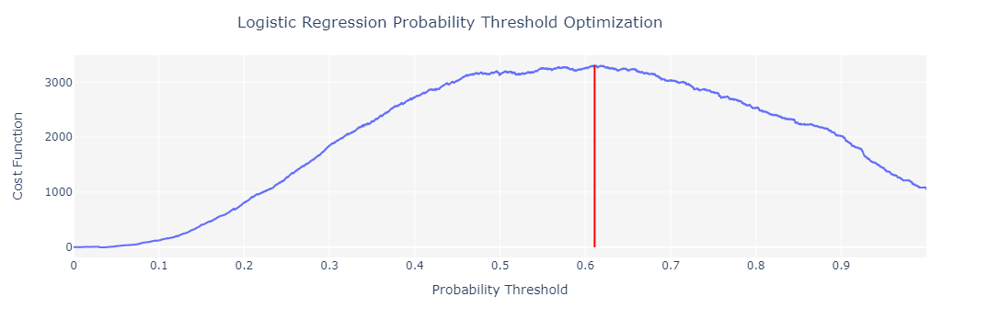

Optimized Probability Threshold: 0.6109 | Optimized Cost Function: 3308


0.6109

In [85]:
optimize_threshold(lr, true_negative = 1, false_negative = -10)

### **Réglage des hyperparamètres du modèle Logistic Regression**

In [92]:
tuned_lr_hyperopt  =  tune_model (lr,  search_library = 'tune-sklearn',search_algorithm = 'hyperopt', n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7670,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7391,0.7672,0.6601,0.1823,0.2857,0.1847,0.2423,9.0126
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7709,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7141,0.7582,0.6917,0.1729,0.2767,0.1719,0.2366,9.8761


In [93]:
results_tuned_lr_hyperopt = pull()
results_tuned_lr_hyperopt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7670,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7391,0.7672,0.6601,0.1823,0.2857,0.1847,0.2423,9.0126
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7709,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7141,0.7582,0.6917,0.1729,0.2767,0.1719,0.2366,9.8761


In [94]:
print(tuned_lr_hyperopt)

LogisticRegression(C=2.020702519597995, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [95]:
tuned_lr_base  =  tune_model (lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7284,0.7675,0.6601,0.1758,0.2776,0.1746,0.2329,9.3796
1,0.7169,0.7428,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7397,0.7672,0.6640,0.1834,0.2874,0.1866,0.2449,8.9911
5,0.7450,0.7955,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7711,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7369,0.7511,0.6364,0.1767,0.2766,0.1745,0.2283,9.0882
8,0.7412,0.7818,0.7194,0.1938,0.3054,0.2065,0.2741,8.9371
9,0.7144,0.7583,0.6917,0.1731,0.2769,0.1722,0.2368,9.8653


In [96]:
results_tuned_lr_base = pull()
results_tuned_lr_base

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7284,0.7675,0.6601,0.1758,0.2776,0.1746,0.2329,9.3796
1,0.7169,0.7428,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7397,0.7672,0.6640,0.1834,0.2874,0.1866,0.2449,8.9911
5,0.7450,0.7955,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7711,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7369,0.7511,0.6364,0.1767,0.2766,0.1745,0.2283,9.0882
8,0.7412,0.7818,0.7194,0.1938,0.3054,0.2065,0.2741,8.9371
9,0.7144,0.7583,0.6917,0.1731,0.2769,0.1722,0.2368,9.8653


In [97]:
print(tuned_lr_base)

LogisticRegression(C=0.118, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [98]:
tuned_lr_optuna  =  tune_model (lr,  search_library = 'tune-sklearn',search_algorithm = 'optuna', n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7670,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7394,0.7672,0.6640,0.1832,0.2872,0.1863,0.2446,9.0019
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7709,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7141,0.7582,0.6917,0.1729,0.2767,0.1719,0.2366,9.8761


In [99]:
results_tuned_lr_optuna = pull()
results_tuned_lr_optuna

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7670,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7394,0.7672,0.6640,0.1832,0.2872,0.1863,0.2446,9.0019
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7709,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7141,0.7582,0.6917,0.1729,0.2767,0.1719,0.2366,9.8761


In [100]:
print(tuned_lr_optuna)

LogisticRegression(C=2.045318045065443, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [102]:
# Sauveagrdes
results_tuned_lr_hyperopt.to_csv('results_model_logistic/results_tuned_lr_hyperopt.csv')
results_tuned_lr_optuna.to_csv('results_model_logistic/results_tuned_lr_optuna.csv')
results_tuned_lr_base.to_csv('results_model_logistic/results_tuned_lr_base.csv')

### **Tracés du modèle logistic regression**

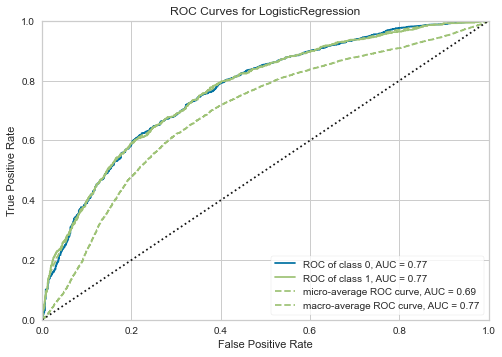

In [103]:
plot_model ( tuned_lr_optuna ,  plot  =  'auc' )

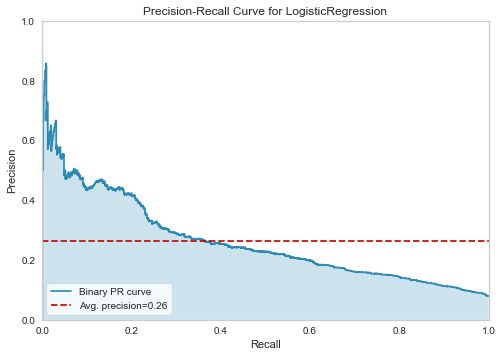

In [104]:
plot_model ( tuned_lr_optuna ,  plot  =  'pr' )

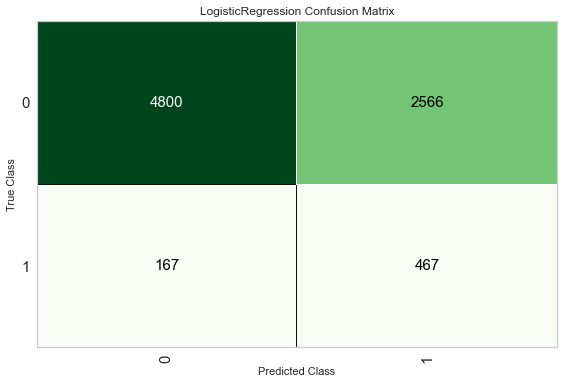

In [105]:
plot_model ( tuned_lr_optuna ,  plot  =  'confusion_matrix' )

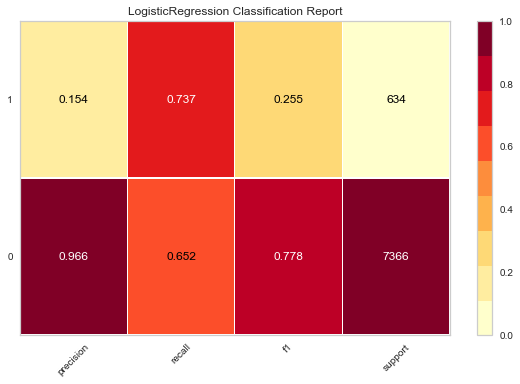

In [106]:
plot_model ( tuned_lr_optuna ,  plot  =  'class_report' )

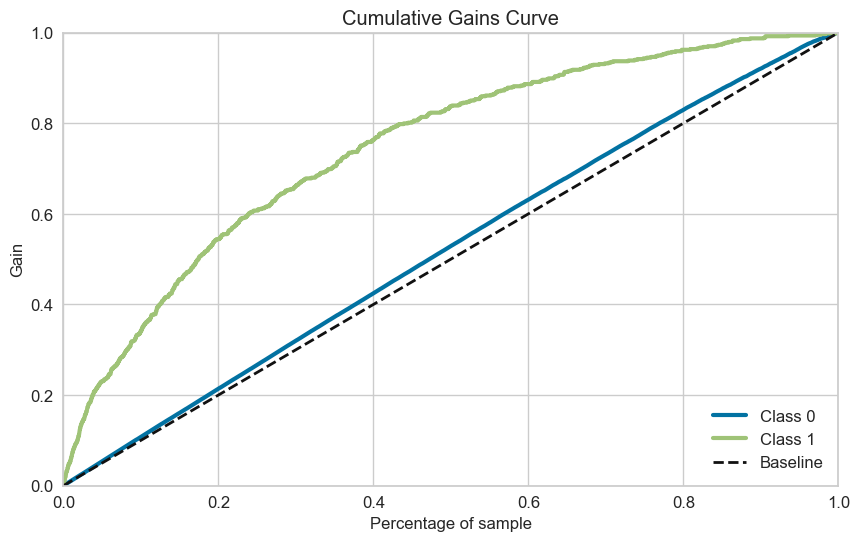

In [107]:
plot_model ( tuned_lr_optuna ,  plot  =  'gain' )

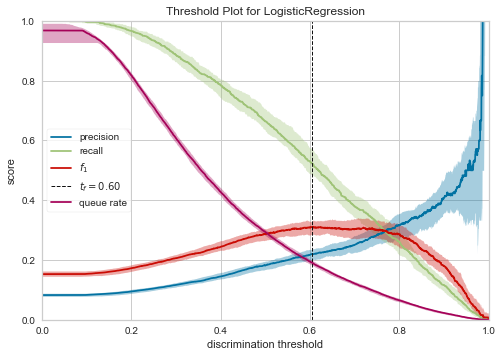

In [108]:
plot_model ( tuned_lr_optuna ,  plot  =  'threshold' )

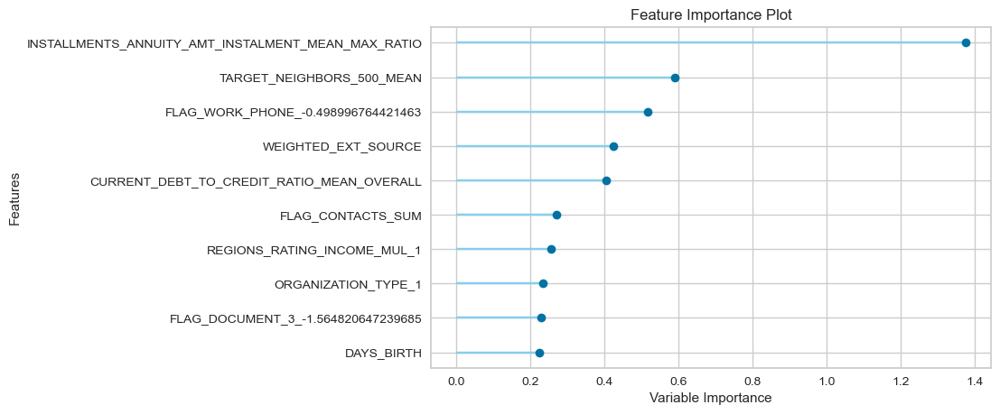

In [109]:
plot_model ( tuned_lr_optuna ,  plot  =  'feature' )

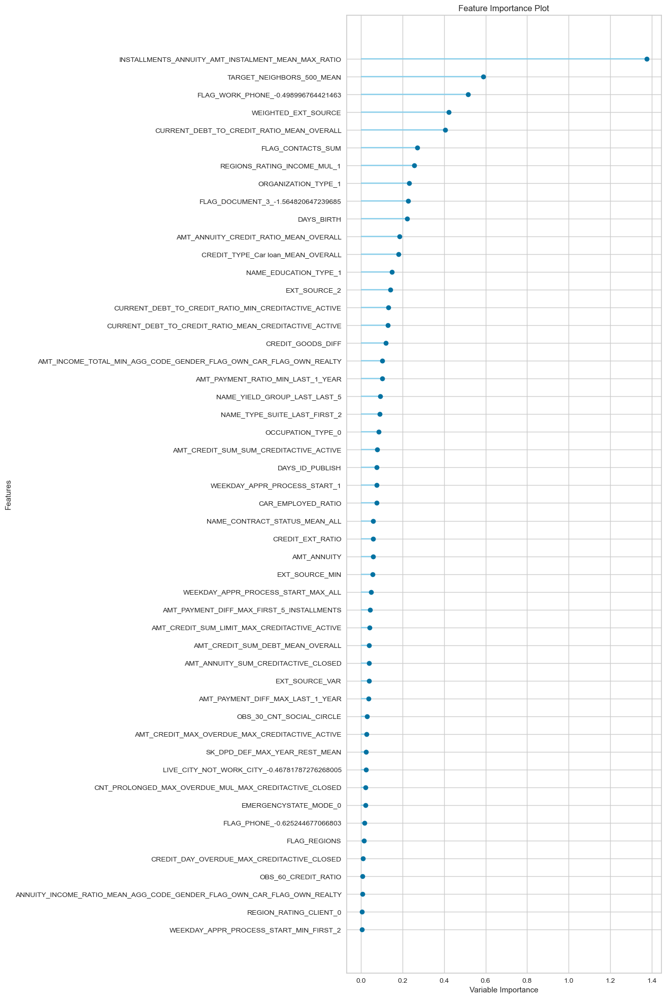

In [110]:
plot_model ( tuned_lr_optuna ,  plot  =  'feature_all' )

In [111]:
plot_model ( tuned_lr_optuna ,  plot  =  'parameter' )

,Parameters
C,2.045318045065443
class_weight,balanced
dual,False
fit_intercept,True
intercept_scaling,1
l1_ratio,None
max_iter,1000
multi_class,auto
n_jobs,None
penalty,l2


### **Interprétation du modèle Logistic Regression**

Non disponible dans la bibliothèque pycaret.

In [ ]:
interpret_model(tuned_lr_optuna)

In [ ]:
interpret_model(tuned_lr_optuna, plot = 'reason', observation = 10)

In [ ]:
interpret_model(tuned_lr_optuna, plot = 'summary')

In [ ]:
interpret_model(tuned_lr_optuna, plot = 'pfi')

In [ ]:
interpret_model(tuned_lr_optuna, plot = 'correlation')

### **Finalisation du modèle Logistic Regression**

In [115]:
final_lr  =  finalize_model ( tuned_lr_optuna )

In [116]:
results_final_lr = pull()
results_final_lr

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7288,0.7670,0.6601,0.1760,0.2779,0.1749,0.2332,9.3688
1,0.7169,0.7427,0.6403,0.1658,0.2634,0.1576,0.2131,9.7790
2,0.7469,0.7582,0.6403,0.1839,0.2857,0.1857,0.2394,8.7428
3,0.7344,0.7343,0.6126,0.1709,0.2672,0.1639,0.2140,9.1746
4,0.7394,0.7672,0.6640,0.1832,0.2872,0.1863,0.2446,9.0019
5,0.7450,0.7954,0.7115,0.1950,0.3061,0.2078,0.2736,8.8076
6,0.7384,0.7709,0.6601,0.1819,0.2852,0.1841,0.2418,9.0342
7,0.7372,0.7508,0.6364,0.1769,0.2769,0.1748,0.2286,9.0774
8,0.7409,0.7813,0.7194,0.1936,0.3051,0.2062,0.2738,8.9479
9,0.7141,0.7582,0.6917,0.1729,0.2767,0.1719,0.2366,9.8761


In [117]:
results_final_lr.to_csv('results_model_logistic/results_final_lr.csv')

In [118]:
print(final_lr)

LogisticRegression(C=2.045318045065443, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


### **Prédire avec le modèle logistic regression sur le holdout du jeu d'entraînement**

In [119]:
pred_lr_holdout = predict_model ( final_lr )
pred_lr_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Logistic Regression,0.7349,0.7811,0.6751,0.1827,0.2875,0.1860,0.2464,9.1573


,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,...,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,FLAG_WORK_PHONE_-0.498996764421463,FLAG_DOCUMENT_3_-1.564820647239685,FLAG_PHONE_-0.625244677066803,LIVE_CITY_NOT_WORK_CITY_-0.46781787276268005,TARGET,Label,Score
0,-0.717826,1.439078,-0.159524,0.963572,0.000000,0.113357,-0.023502,-0.548348,-0.063279,-0.763748,...,-0.304546,-0.391520,-1.044230,0.0,1.0,0.0,0.0,0,0,0.8002
1,1.116249,1.439078,1.371548,0.963572,-0.020491,-1.885379,-0.023502,-0.548348,-0.044547,-0.763741,...,-0.301002,-1.036849,-1.044230,0.0,1.0,0.0,0.0,0,1,0.8033
2,0.003777,-0.747350,-0.025011,-1.033695,-0.020491,0.113357,0.000000,-0.548348,-0.056771,-0.124232,...,-0.241499,-1.036849,0.514445,0.0,1.0,0.0,0.0,0,0,0.5495
3,-0.236757,-1.632332,-0.025011,0.963572,-0.020491,0.113357,-0.023502,-0.548348,-0.049177,-0.763735,...,0.158668,0.253810,0.463619,0.0,1.0,0.0,0.0,0,0,0.8085
4,-0.627626,1.439078,-0.339929,0.963572,-0.020491,0.113357,0.000000,-0.548348,-0.046566,1.215454,...,-0.226654,-1.036849,0.514445,0.0,1.0,0.0,0.0,0,0,0.7766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-0.357025,-0.976404,-0.013142,-1.033695,-0.020491,0.113357,-0.023502,1.295580,-0.048038,-0.763747,...,0.505867,0.899140,-1.594849,0.0,1.0,0.0,0.0,0,0,0.6302
7996,-0.326958,0.449980,-0.339929,0.963572,0.000000,0.113357,0.000000,-0.548348,-0.053226,0.440666,...,0.000000,-1.036849,1.259898,0.0,1.0,0.0,0.0,1,0,0.7743
7997,2.980392,1.439078,-0.072486,0.963572,-0.020491,0.113357,0.000000,1.295580,-0.014622,0.527225,...,-0.273555,-1.036849,-1.594849,0.0,1.0,0.0,0.0,1,1,0.9389
7998,-0.808027,-1.632332,0.384462,0.963572,-0.020491,0.113357,-0.023502,-0.548348,-0.046416,0.961671,...,-0.091145,0.253810,0.463619,0.0,1.0,0.0,0.0,0,0,0.8706


In [121]:
results_pred_lr_holdout = pull()
results_pred_lr_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Logistic Regression,0.7349,0.7811,0.6751,0.1827,0.2875,0.186,0.2464,9.1573


In [122]:
results_final_lr.to_csv('results_model_logistic/results_pred_lr_holdout.csv')

In [ ]:
#from pycaret.utils import check_metric
#from pycaret.utils import check_metric
#AUC = check_metric(unseen_predictions_lr['TARGET'], unseen_predictions_lr['Label'], metric = 'AUC')
#Accuracy = check_metric(unseen_predictions_lr['TARGET'], unseen_predictions_lr['Label'], metric = 'Accuracy')
#F1 = check_metric(unseen_predictions_lr['TARGET'], unseen_predictions_lr['Label'], metric = 'F1')
#Recall = check_metric(unseen_predictions_lr['TARGET'], unseen_predictions_lr['Label'], metric = 'Recall')

#print('AUC : ', AUC)
#print('Accuracy : ', Accuracy)
#print('F1 : ', F1)
#print('Recall : ', Recall)

### **Prédictions avec le modèle logistic regression sur le unseen_data**

In [3]:
test_df_std_50 = pd.read_csv('data_pycaret/test_df_std_50.csv').drop("Unnamed: 0",axis=1)
test_df_std_50.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.0,-0.537128,0.520828,0.032259,0.778367,0.628118,-1.153908,0.102001,-0.396660,-2.712732,-0.269179,1.427241,-0.597571,0.733890,-1.316950,0.0,-0.097658,-0.40123,-0.026219,0.246974,-1.671447,1.054524,-0.027806,0.000000,0.0,-0.013307,0.695343,0.0,-0.497199,-0.277935,-1.004863,-1.345397,-0.258068,-0.030868,1.498238,-0.211078,-0.553548,-0.008465,3.712228,-0.141209,1.669623,-0.459316,0.490887
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.0,-0.537128,0.520828,-0.051266,-0.147840,-0.490678,-1.153908,-0.032606,1.221993,-0.939163,-0.269179,0.910437,-0.597571,0.462198,-0.505711,0.0,-0.799993,-0.40123,-0.026219,0.239994,0.579786,-0.185110,-0.027806,-0.323051,0.0,-0.013307,-4.239521,0.0,1.082484,-0.277935,0.506425,-0.424024,-0.381784,-0.030868,-1.248524,-0.211078,-0.752753,-0.008465,-0.303364,0.033783,-0.945917,-0.459316,-1.081942


In [ ]:
# Echantillon 
# %time test_sample_50_lgb = test_df_std_50.sample(n=40000, random_state=0)

In [ ]:
unseen_predictions_lr  =  predict_model ( final_lr ,  probability_threshold = 0.6 , data = test_df_std_50 ) 
unseen_predictions_lr.head()

In [46]:
unseen_predictions_lr.to_csv('results_model_logistic/unseen_predictions_lr.csv')

In [45]:
# Correction du jeu test prédit sans la cible car predict_model (ci-dessus) avait été lancé avec test_df_std_50 incluant Target par erreur 
# saved_final_logistic  =  load_model ( 'Save_Model/Final Logistic Regression Model 23sept2021' )

# unseen_predictions_lr  =  predict_model ( saved_final_logistic ,  data = test_df_std_50 ) 

# unseen_predictions_lr.head()

Transformation Pipeline and Model Successfully Loaded


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,Label,Score
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.000000,-0.537128,0.520828,0.032259,0.778367,0.628118,-1.153908,0.102001,-0.396660,-2.712732,-0.269179,1.427241,-0.597571,0.733890,-1.316950,0.000000,-0.097658,-0.40123,-0.026219,0.246974,-1.671447,1.054524,-0.027806,0.000000,0.000000,-0.013307,0.695343,0.000000,-0.497199,-0.277935,-1.004863,-1.345397,-0.258068,-0.030868,1.498238,-0.211078,-0.553548,-0.008465,3.712228,-0.141209,1.669623,-0.459316,0.490887,0,0.5787
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.000000,-0.537128,0.520828,-0.051266,-0.147840,-0.490678,-1.153908,-0.032606,1.221993,-0.939163,-0.269179,0.910437,-0.597571,0.462198,-0.505711,0.000000,-0.799993,-0.40123,-0.026219,0.239994,0.579786,-0.185110,-0.027806,-0.323051,0.000000,-0.013307,-4.239521,0.000000,1.082484,-0.277935,0.506425,-0.424024,-0.381784,-0.030868,-1.248524,-0.211078,-0.752753,-0.008465,-0.303364,0.033783,-0.945917,-0.459316,-1.081942,1,0.7689
2,100013,-1.160186,-1.642575,0.543116,-1.073187,0.000000,0.083711,-0.507337,-0.018016,-0.537128,-1.920019,-0.035633,1.031215,-0.490678,-0.592938,-0.032606,1.221993,0.834406,0.000000,-0.287579,-0.597571,0.917830,1.453658,-0.635633,1.154568,-0.40123,-0.026219,0.015561,-1.671447,-0.340064,-0.027806,0.000000,-0.129284,-0.013307,-1.544826,0.388555,3.896689,1.426682,-0.249219,-0.424024,0.000000,-0.030868,1.002287,5.310132,2.519371,0.000000,-0.929873,-0.284322,-0.945917,-0.459316,-1.637561,0,0.8565
3,100028,-0.879135,0.394523,-0.902390,0.928229,-0.032632,0.083711,-0.507337,-0.018016,-0.537128,0.520828,0.005020,3.471615,0.628118,0.529002,-0.032606,-0.396660,-0.939163,0.872692,-0.736836,1.673441,-0.484502,0.833876,-2.770185,0.374196,-0.40123,-0.026219,0.457998,0.579786,-0.882404,-0.027806,-0.323051,0.685985,-0.013307,-0.742446,0.000000,0.641584,-0.269999,-0.098090,-0.424024,-0.266436,-0.030868,-0.044230,-0.211078,1.223277,-0.008465,-0.892740,-0.253043,-0.945917,-0.459316,0.490887,0,0.7826
4,100038,0.619804,0.343595,0.023184,-1.073187,0.000000,0.083711,1.971078,0.000000,1.276328,0.520828,-0.032174,0.930134,0.628118,-0.592938,-0.032606,1.221993,-0.347973,0.000000,-0.771247,-0.597571,-0.700505,-1.055537,0.000000,-0.790919,-0.40123,0.000000,0.266195,0.579786,-0.882404,0.000000,0.000000,0.000000,0.000000,0.695343,0.192686,0.641584,-0.277935,0.506425,0.497349,0.000000,0.000000,-0.508735,0.000000,0.164881,0.000000,-0.023167,0.000000,1.015738,2.177152,-1.637561,1,0.5660


### **Sauvegarde du modèle logistic regression**

In [126]:
save_model ( final_lr ,  'Save_Model/Final Logistic Regression Model 23sept2021' )

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['SK_ID_CURR'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 n...
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  LogisticRegression(C=2.045318045065